In [49]:
import matplotlib.pyplot as plt
import numpy as np
from open_ephys.analysis import Session
import os
import re
from scipy.signal import butter, filtfilt, lfilter
from collections import defaultdict
import scipy.stats as stats


# ==== Select Session ====
w = 1  # recordnode index 1 = Record Node 111 RAW is Offline Filtered
u = 0       # recordnode index 0 = Record Node 106 is Online Filtered


def scan_experiment_structure(session_dir, record_node_name="Record Node 106"):
    node_path = os.path.join(session_dir, record_node_name)
    
    if not os.path.exists(node_path):
        print(f"Record Node directory not found: {node_path}")
        return {}
    
    experiment_info = defaultdict(list)
    for item in sorted(os.listdir(node_path)):
        exp_path = os.path.join(node_path, item)
        if os.path.isdir(exp_path) and item.startswith("experiment"):
            recordings = [r for r in sorted(os.listdir(exp_path)) 
                          if os.path.isdir(os.path.join(exp_path, r)) and r.startswith("recording")]
            experiment_info[item] = recordings
    return experiment_info

# ==== Load Session ====
#directory = 'SAP-55_2025-06-09_11-12-19_001'
#directory = 'SNARE-31_2025-07-22_17-09-49_002'

#directory = 'SNARE-38_TEST2025-07-24_13-46-09_003'
directory = 'SNARE-38-TEST3_2025-07-24_16-05-17_002'


session = Session(directory)
print('Pass Initial Test, Moving on to Loading Session...\n')

# === Scan structure ===
record_node_name = "Record Node 106" if w == 0 else "Record Node 111"
structure = scan_experiment_structure(directory, record_node_name)

Pass Initial Test, Moving on to Loading Session...



In [50]:
# === Flatten experiment-recording pairs to loop ===
flat_recordings = []
for exp_name, rec_list in structure.items():
    for rec in rec_list:
        flat_recordings.append((exp_name, rec))

Processing: x=0, y=recording1, exp=experiment1, yy=recording1

EXPERIMENT1, Recording 1
Open Ephys GUI Recording
ID: 0x19d61618650
Format: Binary
Directory: SNARE-38-TEST3_2025-07-24_16-05-17_002\Record Node 111\experiment1\recording1
Experiment Index: 0
Recording Index: 0
Processor ID: 100, Stream Name: Rhythm Data, Line: 1 (main sync line))
  First event sample number: 12828385
  Last event sample number: 21609448
  Total sync events: 404
  Sample rate: 5000.0
Channels: ['CH1', 'CH5', 'CH7', 'CH11', 'ADC1'] 

Loaded 569 MessageCenter entries
[Time: 2564.595200 s] Message: Starting at 0.01 mA
[Time: 2565.665800 s] Message: RHDCONTROL TRIGGER 1 500.0
[Time: 2568.342600 s] Message: RHDCONTROL TRIGGER 1 500.0
[Time: 2569.566200 s] Message: RHDCONTROL TRIGGER 1 500.0
[Time: 2570.369400 s] Message: RHDCONTROL TRIGGER 1 500.0
[Time: 2571.937200 s] Message: RHDCONTROL TRIGGER 1 500.0
[Time: 2574.002000 s] Message: Starting at 0.05 mA
[Time: 2579.164400 s] Message: Starting at 0.05 mA
[Time: 

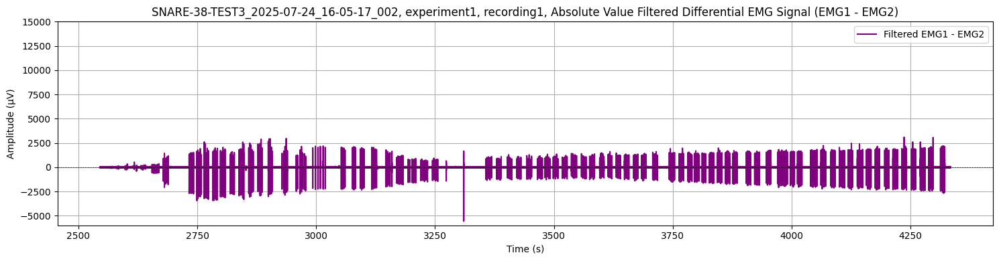

In [67]:
x = 0
exp = "experiment1"
yy = "recording1"
y = f"recording{x + 1}"  # sequential label used in some parts of your code
v = f"Record Node 106" if w == 0 else f"Record Node 111"
vv = f"Record Node 111" if u == 0 else f"Record Node 106"
i = 1

try:
    recording = session.recordnodes[w].recordings[x]
    #recording_offline = session.recordnodes[w].recordings[x]
except IndexError:
    print(f"No recording {x+1} found in {exp}/{yy}")
    

print(f"Processing: x={x}, y={y}, exp={exp}, yy={yy}")

# ==== Sync Setup ====
print(f"\n{exp.upper()}, Recording {x+1}")
print(recording)

# Only add sync line if a main one doesn't already exist
has_main_sync = any(sync.get("main", True) for sync in recording.sync_lines)
if not has_main_sync:
    recording.add_sync_line(1, 100, 'Rhythm Data', main=True)

recording.compute_global_timestamps()

metadata = recording.continuous[0].metadata
channel_names = metadata['channel_names']
print("Channels:", channel_names, '\n')

timestamps = recording.continuous[0].timestamps
#data_offline =  recording_offline.continuous[0].get_samples(start_sample_index=0, end_sample_index=len(timestamps))
data = recording.continuous[0].get_samples(start_sample_index=0, end_sample_index=len(timestamps))
sample_rate = metadata['sample_rate']

# ==== EMG Processing ====
emg1_raw = data[:, 2]
emg2_raw = data[:, 3]
differential = (emg2_raw - emg1_raw)
lowcut = 100
highcut = 1000

b, a = butter(2, np.array([lowcut, highcut])/(sample_rate/2), btype='bandpass')


#y = lfilter(b, a, x) # only filters in the forward direction

differential_filt = lfilter(b, a, differential)
differential_emg = differential_filt

# ==== Load ADC1 (for stim detection) ====
adc1 = np.abs(data[:, 4])  # adjust if your ADC1 channel index differs

# ==== Sync Events ====
events = recording.events
sync_events = events[(events.line == 1) & (events.processor_id == 100) &
                        (events.stream_name == 'Rhythm Data') & (events.state == 1)]
sync_timestamps = sync_events['timestamp'].to_numpy()

# ==== Load MessageCenter ====
messagecenter_dir = os.path.join(directory, v, exp, yy, "events", "MessageCenter")
if not os.path.exists(messagecenter_dir):
    print(f"MessageCenter directory not found for {exp}/{yy}")
    

texts = np.load(os.path.join(messagecenter_dir, "text.npy"), allow_pickle=True)
timestamps_msg = np.load(os.path.join(messagecenter_dir, "timestamps.npy"))
decoded_texts = [t.decode('utf-8') if isinstance(t, bytes) else str(t) for t in texts]
message_entries = list(zip(timestamps_msg, decoded_texts))
print(f"Loaded {len(decoded_texts)} MessageCenter entries")

# ==== Debug Print ====
for text, time in zip(decoded_texts, timestamps_msg):
    print(f"[Time: {time:.6f} s] Message: {text}")

# ==== Full Trace Plot ====
plt.figure(figsize=(15, 4))
plt.plot(timestamps, differential_emg, label="Filtered EMG1 - EMG2", color='purple')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5)
plt.title(f"{directory}, {exp}, {yy}, Absolute Value Filtered Differential EMG Signal (EMG1 - EMG2)")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude (μV)")
plt.grid(True)
plt.legend()
plt.ylim(top=15000)
plt.tight_layout()
plt.show()


In [68]:
# ==== Peri-Stimulus Analysis with Shaded Stimulus Duration ====
pre_event_time = 5   # ms before calculated stim start
post_event_time = 20 # ms after calculated stim start
stim_threshold = 0.1 # ADC1 threshold to detect pulse (adjust if needed)
offstim_threshold = 3

peri_stim_segments = []
peri_stim_segments_adc1 = []
segment_stim_end_times = []
segment_stim_start_times = []

In [69]:
for stamp in sync_timestamps:
        # First, find approximate sample index around the sync pulse
        #idx_start = np.searchsorted(timestamps, stamp)
        #idx_end   = np.searchsorted(timestamps, stamp + 0.010)
        #idx_center = (idx_start + idx_end)/2

        idx_search_start = np.searchsorted(timestamps, stamp - 0.00002)  # 10 ms before sync
        idx_search_end   = np.searchsorted(timestamps, stamp + 0.010)  # 10 ms after sync

        if idx_search_start < 0 or idx_search_end > len(timestamps):
            continue

        adc1_segment_for_detection = adc1[idx_search_start:idx_search_end]
        time_segment_for_detection = timestamps[idx_search_start:idx_search_end]

        # Detect true stim start: first crossing above threshold in that window
        above_idxs = np.where(adc1_segment_for_detection > stim_threshold)[0]
        
        if len(above_idxs) == 0:
            continue
        stim_start_idx = idx_search_start + above_idxs[0]
        stim_start_time = timestamps[stim_start_idx]

        # Now define peri-stimulus window around this stim_start_time
        idx_pre  = int(stim_start_idx - (pre_event_time / 1000) * sample_rate)
        idx_post = int(stim_start_idx + (post_event_time / 1000) * sample_rate)

        if idx_pre < 0 or idx_post > len(timestamps):
            continue

        # Extract windows
        time_window = timestamps[idx_pre:idx_post]
        time_zeroed = time_window - stim_start_time  # in seconds

        emg_window  = differential_emg[idx_pre:idx_post]
        adc1_window = adc1[idx_pre:idx_post]

        # Detect stim end: first time after stim_start where ADC1 falls back below threshold
        post_onset_mask = (time_zeroed >= 0)
        adc1_post_onset = adc1_window[post_onset_mask]
        time_post_onset = time_zeroed[post_onset_mask]

        below_idxs = np.where(adc1_post_onset < offstim_threshold)[0]
        if len(below_idxs) > 0:
            stim_end_time = time_post_onset[below_idxs[0]] * 1000  # convert to ms
        else:
            stim_end_time = post_event_time

        # Save for grouping
        peri_stim_segments.append((time_zeroed * 1000, emg_window, stim_end_time))
        peri_stim_segments_adc1.append(adc1_window)
        segment_stim_start_times.append(stim_start_time)
        segment_stim_end_times.append(stim_end_time)


In [70]:
print(time_window)
print(idx_search_start)
print(idx_search_end)
print(peri_stim_segments_adc1)
print(peri_stim_segments)
print(stim_end_time)
type(stim_end_time)

[4321.8846 4321.8848 4321.885  4321.8852 4321.8854 4321.8856 4321.8858
 4321.886  4321.8862 4321.8864 4321.8866 4321.8868 4321.887  4321.8872
 4321.8874 4321.8876 4321.8878 4321.888  4321.8882 4321.8884 4321.8886
 4321.8888 4321.889  4321.8892 4321.8894 4321.8896 4321.8898 4321.89
 4321.8902 4321.8904 4321.8906 4321.8908 4321.891  4321.8912 4321.8914
 4321.8916 4321.8918 4321.892  4321.8922 4321.8924 4321.8926 4321.8928
 4321.893  4321.8932 4321.8934 4321.8936 4321.8938 4321.894  4321.8942
 4321.8944 4321.8946 4321.8948 4321.895  4321.8952 4321.8954 4321.8956
 4321.8958 4321.896  4321.8962 4321.8964 4321.8966 4321.8968 4321.897
 4321.8972 4321.8974 4321.8976 4321.8978 4321.898  4321.8982 4321.8984
 4321.8986 4321.8988 4321.899  4321.8992 4321.8994 4321.8996 4321.8998
 4321.9    4321.9002 4321.9004 4321.9006 4321.9008 4321.901  4321.9012
 4321.9014 4321.9016 4321.9018 4321.902  4321.9022 4321.9024 4321.9026
 4321.9028 4321.903  4321.9032 4321.9034 4321.9036 4321.9038 4321.904
 4321.9042

numpy.float64

In [71]:
# ==== Dynamically determine stimulation groups based on event messages ====

# First, extract only trigger messages and stim setting messages
trigger_pattern = re.compile(r"RHDCONTROL TRIGGER")
stim_pattern = re.compile(r"starting(?: at)? (\d+\.?\d*)\s*mA", re.IGNORECASE)

stim_groups = []
current_group = []
current_amp = None
trigger_times = []

for t, msg in message_entries:
    if stim_pattern.search(msg):
        # Save the previous group if any
        if current_amp is not None and current_group:
            stim_groups.append((current_amp, current_group))
        # Start new group
        current_amp = float(stim_pattern.search(msg).group(1))
        current_group = []
    elif trigger_pattern.search(msg):
        if current_amp is not None:
            current_group.append(t)

# Don't forget to save the last group
if current_amp is not None and current_group:
    stim_groups.append((current_amp, current_group))


In [72]:
# ==== Match trigger times to peri_stim_segments ====
# Create dictionary to associate each stim amplitude to its segments
stim_intensities = []
m_wave_peaks = []
h_wave_peaks = []

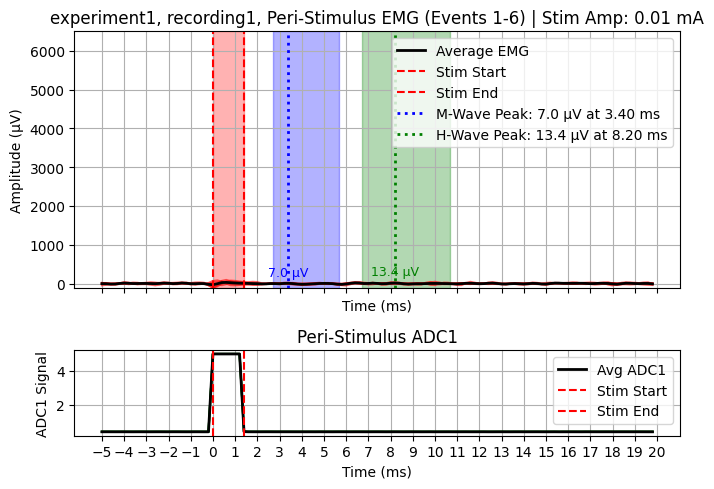

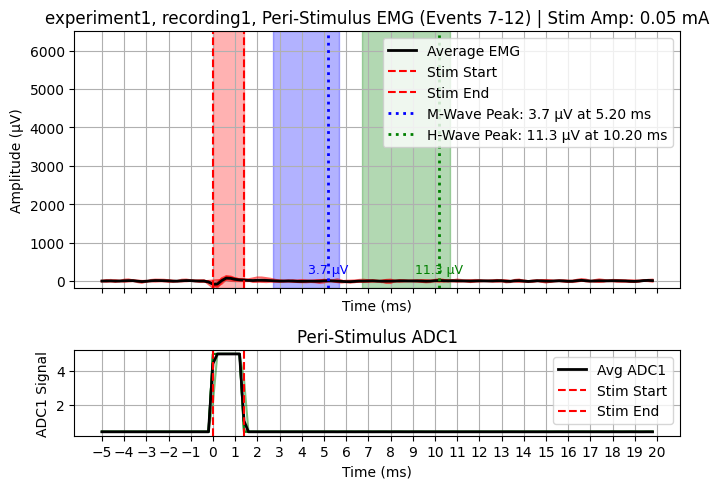

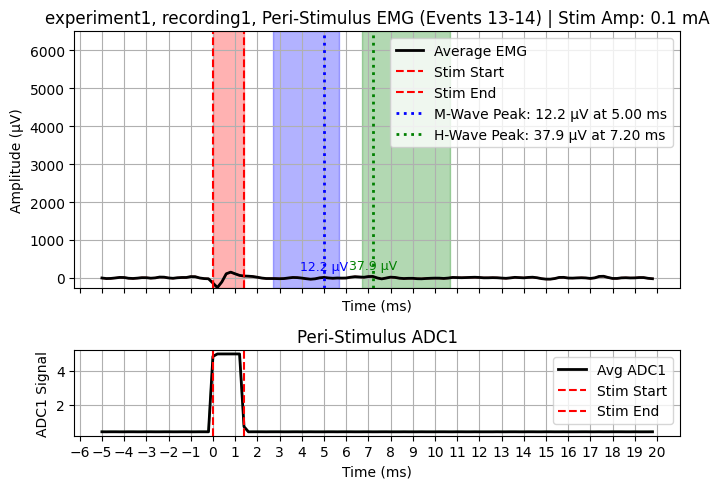

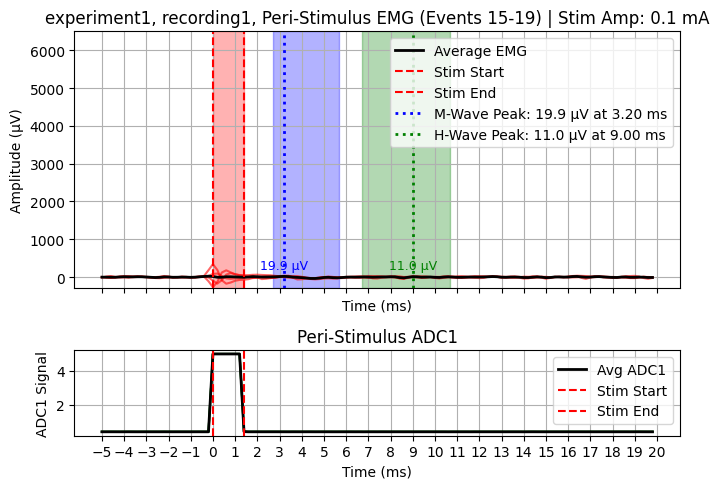

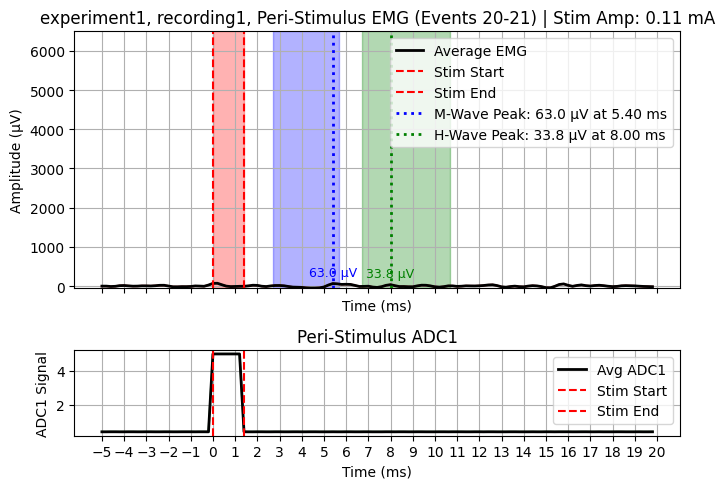

...

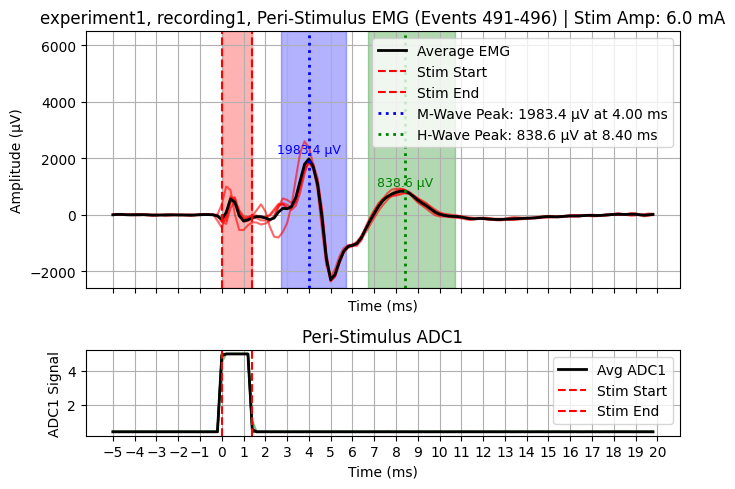

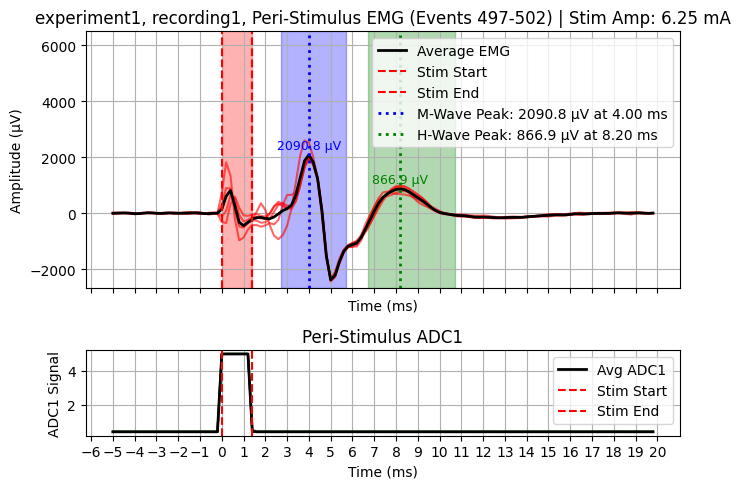

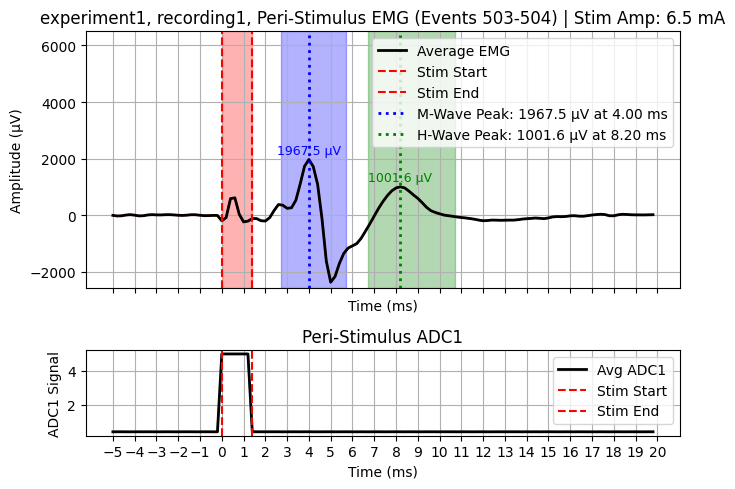

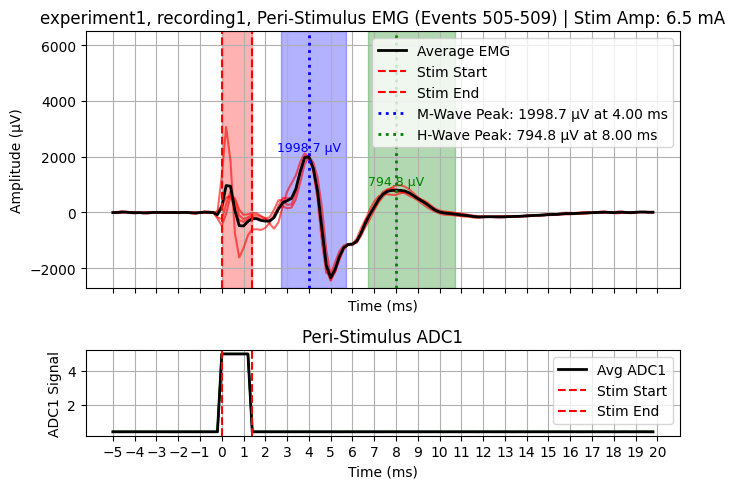

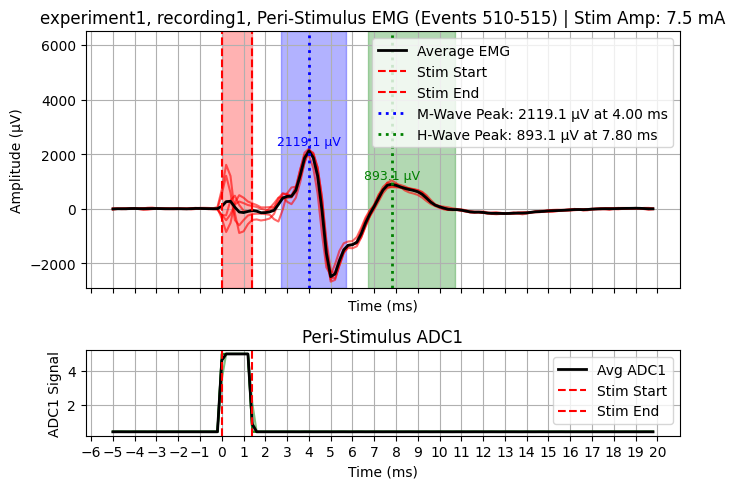

In [73]:
for stim_amp, trigger_times_group in stim_groups:
    # For each trigger time, find matching peri_stim segment (by start time)
    group_data = []
    group_start_times = []
    group_end_times = []
    group_adc1 = []

    for trig_time in trigger_times_group:
        # Find closest stim_start_time to this trigger time
        idx_match = np.argmin(np.abs(np.array(segment_stim_start_times) - trig_time))
        # Extra check: ensure it's reasonably close (e.g., within 100 ms)
        if abs(segment_stim_start_times[idx_match] - trig_time) < 0.1:
            group_data.append(peri_stim_segments[idx_match])
            group_adc1.append(peri_stim_segments_adc1[idx_match])
            group_start_times.append(segment_stim_start_times[idx_match])
            group_end_times.append(segment_stim_end_times[idx_match])

    if not group_data:
        continue  # skip if no valid matching data

    # Proceed with same logic as original
    time_ms_matrix = np.stack([gd[0] for gd in group_data])
    emg_matrix     = np.stack([gd[1] for gd in group_data])

    avg_time_ms = time_ms_matrix[0]  # identical for all in group
    avg_adc1 = np.mean(group_adc1, axis=0)
    avg_emg     = np.mean(emg_matrix, axis=0)
    avg_end_ms  = np.mean(group_end_times)

    stim_intensities.append(stim_amp)

    #plt.figure(figsize=(7, 4))
    fig, axs = plt.subplots(2, 1, figsize=(7, 5), sharex=True, gridspec_kw={'height_ratios':[3,1]})

    for (_, trace, _) in group_data:
        axs[0].plot(avg_time_ms, trace, color='red', alpha=0.6)
    axs[0].plot(avg_time_ms, avg_emg, color='black', linewidth=2, label='Average EMG')

    axs[0].axvline(x=0, color='red', linestyle='--', label='Stim Start')

    #plt.axvline(x=1.0, color='red', linestyle='--', label='_nolegend_')
    #plt.axvspan(0, 1.0, color='red', alpha=0.3)

    #---------------Here we can manually set the red box width for the stimm ----------------#
    axs[0].axvline(x=stim_end_time, color='red', linestyle='--', label='Stim End')
    axs[0].axvspan(0, stim_end_time, color='red', alpha=0.3)

    m_wave_start, m_wave_end = stim_end_time/2 + 2,stim_end_time/2 + 5.0
    h_wave_start, h_wave_end = stim_end_time/2 + 6, stim_end_time/2 + 10

    

    axs[0].axvspan(m_wave_start, m_wave_end, color='blue', alpha=0.3)
    axs[0].axvspan(h_wave_start, h_wave_end, color='green', alpha=0.3)

    m_wave_mask = (avg_time_ms >= m_wave_start) & (avg_time_ms <= m_wave_end)
    m_wave_time_window = avg_time_ms[m_wave_mask]
    m_wave_emg_window = avg_emg[m_wave_mask]
    m_wave_peak_idx = np.argmax(m_wave_emg_window)
    m_wave_peak_time = m_wave_time_window[m_wave_peak_idx]
    m_wave_peak_amp = m_wave_emg_window[m_wave_peak_idx]
    m_wave_peaks.append(m_wave_peak_amp)

    h_wave_mask = (avg_time_ms >= h_wave_start) & (avg_time_ms <= h_wave_end)
    h_wave_time_window = avg_time_ms[h_wave_mask]
    h_wave_emg_window = avg_emg[h_wave_mask]
    h_wave_peak_idx = np.argmax(h_wave_emg_window)
    h_wave_peak_time = h_wave_time_window[h_wave_peak_idx]
    h_wave_peak_amp = h_wave_emg_window[h_wave_peak_idx]
    h_wave_peaks.append(h_wave_peak_amp)

    axs[0].axvline(x=m_wave_peak_time, color='blue', linestyle=':', linewidth=2,
                label=f'M-Wave Peak: {m_wave_peak_amp:.1f} μV at {m_wave_peak_time:.2f} ms')
    axs[0].axvline(x=h_wave_peak_time, color='green', linestyle=':', linewidth=2,
                label=f'H-Wave Peak: {h_wave_peak_amp:.1f} μV at {h_wave_peak_time:.2f} ms')

    axs[0].text(m_wave_peak_time, m_wave_peak_amp + 200, f'{m_wave_peak_amp:.1f} μV',
                color='blue', fontsize=9, ha='center')
    axs[0].text(h_wave_peak_time, h_wave_peak_amp + 200, f'{h_wave_peak_amp:.1f} μV',
                color='green', fontsize=9, ha='center')
    
    #plt.title(
    #    f"{exp}, {yy}, Peri-Stimulus EMG "
    #    f"(Triggers: {len(group_data)}) | Stim Amp: {stim_amp} mA"
    #)
    axs[0].set_title(
        f"{exp}, {yy}, Peri-Stimulus EMG "
        f"(Events {i}-{i + (1)*len(group_data)}) | Stim Amp: {stim_amp} mA"
    )
    axs[0].set_xlabel("Time (ms)")
    axs[0].set_ylabel("Amplitude (μV)")
    axs[0].grid(True)
    axs[0].legend()
    axs[0].set_ylim(top=6500)

    min_ms = int(np.floor(avg_time_ms[0]))
    max_ms = int(np.ceil(avg_time_ms[-1]))
    axs[0].set_xticks(np.arange(min_ms, max_ms + 1, 1))
    #axs[0].tick_params(labelbottom=True)
    #axs[0].set_xlim(min_ms, max_ms)  # ensures full range is visible
    #axs[0].set_xticks(np.arange(int(avg_time_ms[0])-1, int(avg_time_ms[-1])+2, 1))
    #axs[0].set_xticks(np.arange(np.floor(avg_time_ms[0]), np.ceil(avg_time_ms[-1]) + 1, 1))
    
    


    for (trace) in group_adc1:
        axs[1].plot(avg_time_ms, trace, color='green', alpha=0.5)
    axs[1].plot(avg_time_ms, avg_adc1, color='black', linewidth=2, label='Avg ADC1')
    axs[1].axvline(0, color='red', linestyle='--', label='Stim Start')
    axs[1].axvline(stim_end_time, color='red', linestyle='--', label='Stim End')
    axs[1].set_title("Peri-Stimulus ADC1")
    axs[1].set_xlabel("Time (ms)")
    axs[1].set_ylabel("ADC1 Signal")
    axs[1].legend()
    axs[1].grid(True)
    axs[1].set_xticks(np.arange(min_ms, max_ms + 1, 1))
    #axs[1].set_xlim(min_ms, max_ms)
    #axs[1].set_xticks(np.arange(int(avg_time_ms[0])-1, int(avg_time_ms[-1])+2, 1))
    #axs[1].set_xticks(np.arange(np.floor(avg_time_ms[0]), np.ceil(avg_time_ms[-1]) + 1, 1))

    plt.tight_layout()
    plt.show()
    i = i + (1)*len(group_data) + 1

In [65]:
#avg_emg  = np.mean(group_emg, axis=0)
#avg_adc1 = np.mean(group_adc1, axis=0)
#avg_end_time = np.mean(segment_stim_end_times)
#print(trace)
#print(time_ms)
#print(avg_adc1)
#print(avg_emg)
#print(avg_end_time)
#print(segment_stim_start_times)
#print(group_emg)

C:\Users\dal866445\AppData\Local\Temp\ipykernel_70372\137190498.py:18: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  m_sems  = np.array([stats.sem(peaks) for peaks in m_wave_data])
C:\Users\dal866445\AppData\Local\Temp\ipykernel_70372\137190498.py:19: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  h_sems  = np.array([stats.sem(peaks) for peaks in h_wave_data])


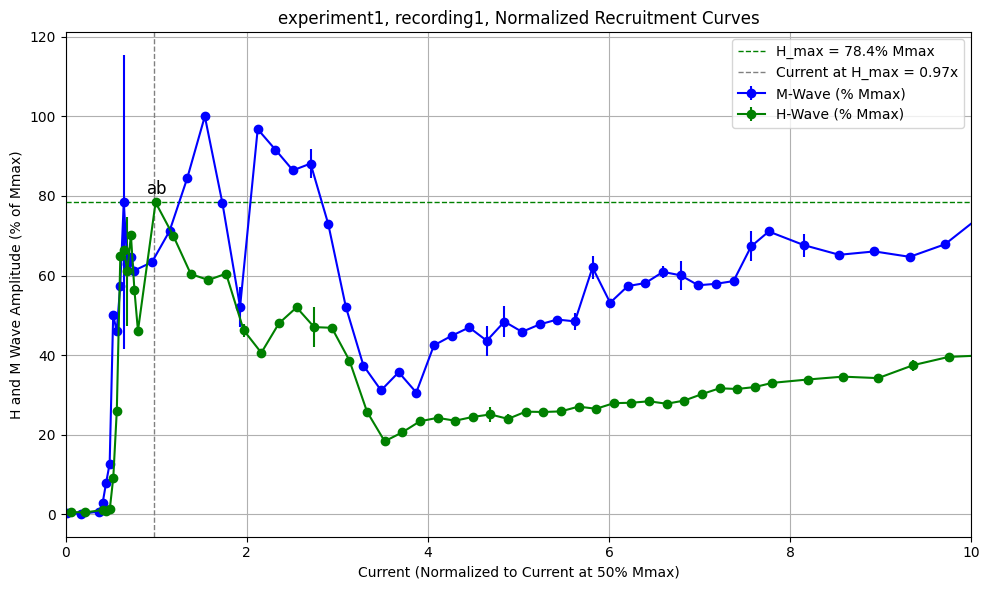

In [83]:
# ==== Group and Normalize Peak Amplitudes ====
m_wave_dict = defaultdict(list)
h_wave_dict = defaultdict(list)

# Ensure all amplitudes are absolute values
for amp, m_peak, h_peak in zip(stim_intensities, m_wave_peaks, h_wave_peaks):
    m_wave_dict[amp].append(abs(m_peak))
    h_wave_dict[amp].append(abs(h_peak))

# Sort stimulation intensities
sorted_amps = sorted(set(stim_intensities))
m_wave_data = [m_wave_dict[amp] for amp in sorted_amps]
h_wave_data = [h_wave_dict[amp] for amp in sorted_amps]

# Compute means
m_means = np.array([np.mean(peaks) for peaks in m_wave_data])
h_means = np.array([np.mean(peaks) for peaks in h_wave_data])
m_sems  = np.array([stats.sem(peaks) for peaks in m_wave_data])
h_sems  = np.array([stats.sem(peaks) for peaks in h_wave_data])

# Find M_max and normalize amplitudes
M_max = np.max(m_means)
m_means_norm = (m_means / M_max) * 100
h_means_norm = (h_means / M_max) * 100
m_sems_norm  = (m_sems  / M_max) * 100
h_sems_norm  = (h_sems  / M_max) * 100

# Interpolate M-curve to find current at 50% M_max
from scipy.interpolate import interp1d

interp_func = interp1d(m_means_norm, sorted_amps, kind='linear', bounds_error=False, fill_value='extrapolate')
try:
    current_at_50_percent = float(interp_func(50))
except:
    current_at_50_percent = sorted_amps[np.argmax(m_means_norm >= 50)]

# Normalize current axis
normalized_currents = np.array(sorted_amps) / current_at_50_percent

# Mark H_max (point "a") and Current at H_max (point "b")
H_max = np.max(h_means_norm)
idx_Hmax = np.argmax(h_means_norm)
current_at_Hmax_norm = normalized_currents[idx_Hmax]

# ==== Plot Normalized Recruitment Curves ====
fig, ax = plt.subplots(figsize=(10, 6))

# Overlay normalized mean ± SEM
ax.errorbar(normalized_currents - 0.02, m_means_norm, yerr=m_sems_norm, fmt='o-', color='blue', label='M-Wave (% Mmax)')
ax.errorbar(normalized_currents + 0.02, h_means_norm, yerr=h_sems_norm, fmt='o-', color='green', label='H-Wave (% Mmax)')

# Add point "a" (H_max) and "b" (Current at H_max)
ax.axhline(H_max, color='green', linestyle='--', linewidth=1, label=f'H_max = {H_max:.1f}% Mmax')
ax.axvline(current_at_Hmax_norm, color='gray', linestyle='--', linewidth=1, label=f'Current at H_max = {current_at_Hmax_norm:.2f}x')

# Add labels
ax.text(current_at_Hmax_norm + 0.02, H_max + 2, 'b', fontsize=12, color='black')
ax.text(normalized_currents[idx_Hmax] - 0.08, H_max + 2, 'a', fontsize=12, color='black')

# Aesthetics
#ax.set_xticks(np.round(normalized_currents, 2))
#ax.set_xticklabels([f"{x:.2f}" for x in normalized_currents])
ax.set_xlabel("Current (Normalized to Current at 50% Mmax)")
ax.set_ylabel("H and M Wave Amplitude (% of Mmax)")
ax.set_title(f"{exp}, {yy}, Normalized Recruitment Curves")
ax.grid(True)
ax.legend()
# Set window size here
ax.set_xlim(right=10)
ax.set_xlim(left=0)
plt.tight_layout()
plt.show()




